## Forecasting the Yield Spread Using PCA, Vasicek and ARIMA Models

In [1]:
import os
wd = os.getcwd()
wd

'/Users/joshi27s/Desktop/Summer 2020/Yield'

In [2]:
import warnings
warnings.filterwarnings('ignore')

import datetime
from datetime import date, timedelta
import quandl
import numpy as np
import pandas as pd
import scipy
import statsmodels.api as sm

import sklearn.decomposition as sck_dec # has PCA functionalities
import sklearn.decomposition.pca as PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler # for standardizing the Data
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
from pandas import DataFrame


import matplotlib
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
matplotlib.style.use('ggplot')
%matplotlib inline
import matplotlib.pyplot as plt


# standardizes the size of all plots, rather than typing plot(figsize = (12,6)) everytime
from pylab import rcParams
rcParams['figure.figsize'] = 12,6 

import seaborn as sns
from plotly import __version__ 
import cufflinks as cf 
from IPython.display import display, HTML, Image
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go

# set plotly to offline mode for easy reproducibilty
plotly.offline.init_notebook_mode()

from statsmodels.tsa.stattools import adfuller,grangercausalitytests
from statsmodels.tsa.stattools import ccovf,ccf,periodogram
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

quandl.ApiConfig.api_key = '-kesKc4A8jkkBwyX3rSX'

In [321]:
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')

treas = ['FRED/DGS3MO',
           'FRED/DGS6MO',
           'FRED/DGS1',
           'FRED/DGS2',
           'FRED/DGS3',
           'FRED/DGS5',
           'FRED/DGS7',
           'FRED/DGS10',
           'FRED/DGS20',
           'FRED/DGS30',
           'FRED/T10Y3M'] # 10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity

data = quandl.get(treas, start_date = "1993-10-01", end_date="2020-06-30",collapse = 'daily',date_parser=parser)
data.columns = ['tres3mo', 
                    'tres6mo',
                    'tres1y',
                    'tres2y',
                    'tres3y',
                    'tres5y',
                    'tres7y',
                    'tres10y',
                    'tres20y',
                    'tres30y',
                    'yieldsp']


,tres3mo,tres6mo,tres1y,tres2y,tres3y,tres5y,tres7y,tres10y,tres20y,tres30y,yieldsp
Date,,,,,,,,,,,
2020-06-24,0.15,0.17,0.17,0.19,0.21,0.33,0.52,0.69,1.21,1.44,0.54
2020-06-25,0.16,0.17,0.17,0.17,0.21,0.32,0.53,0.68,1.20,1.43,0.52
2020-06-26,0.14,0.17,0.17,0.17,0.19,0.30,0.49,0.64,1.15,1.37,0.50
2020-06-29,0.14,0.18,0.16,0.16,0.18,0.28,0.47,0.64,1.16,1.39,0.50
2020-06-30,0.16,0.18,0.16,0.16,0.18,0.29,0.49,0.66,1.18,1.41,0.50


In [358]:
data.head()

,tres3mo,tres6mo,tres1y,tres2y,tres3y,tres5y,tres7y,tres10y,tres20y,tres30y,yieldsp
Date,,,,,,,,,,,
1993-10-01,2.98,3.11,3.35,3.84,4.18,4.72,5.03,5.34,6.12,5.98,2.36
1993-10-04,3.02,3.17,3.35,3.85,4.16,4.71,5.04,5.34,6.10,5.99,2.32
1993-10-05,3.06,3.20,3.38,3.86,4.18,4.72,5.05,5.35,6.12,6.01,2.29
1993-10-06,3.04,3.19,3.36,3.85,4.16,4.70,5.05,5.35,6.12,6.01,2.31
1993-10-07,3.05,3.17,3.35,3.83,4.15,4.69,5.05,5.33,6.11,6.01,2.28


In [323]:
np.isnan(data).any() # check of data contains nan. If true => nan or inf are present

tres3mo    False
tres6mo    False
tres1y     False
tres2y     False
tres3y     False
tres5y     False
tres7y     False
tres10y    False
tres20y    False
tres30y     True
yieldsp    False
dtype: bool

In [351]:
# fill the NaN values with "ffill", and replaces inf values with 0
# ffill = forward fill

data_df = data.interpolate(method='spline', order=3).replace([np.inf, -np.inf], 0)

#data_df = data.fillna(method='ffill').replace([np.inf, -np.inf], 0)
np.isnan(data_df).any() # checks for NaN values => there are none

tres3mo    False
tres6mo    False
tres1y     False
tres2y     False
tres3y     False
tres5y     False
tres7y     False
tres10y    False
tres20y    False
tres30y    False
yieldsp    False
dtype: bool

In [423]:
data1 = data_df.loc[:, data.columns != 'yieldsp']
data_df.shape

(6691, 11)

In [424]:
fig_tres = data1.iplot(asFigure=True, kind='scatter', xTitle='Year', 
                                                 yTitle='Treasury Rates')
fig_tres

In [354]:
##Plot an interactive 3D yield curve for varying maturities

ids = ['30-year', '20-year', '10-year', '7-year', '5-year', '3-year', '2-year','1-year', '6-month', '3-month',
       '1-month']

plotly.offline.iplot({
    "data": [
        go.Surface(
            # assign data
            x=ids,
            y=data1.index,
            z=data1.values,
            colorscale='Blues',

            # reverse scale and remove colorbar
            reversescale=True,
            showscale=False,

            # show contours on x axis only
            contours={
                'x': {
                    'highlight': True,
                    'highlightcolor': '#FFFFFF',
                    'highlightwidth': 1
                },
                'y': {
                    'highlight': False
                },
                'z': {
                    'highlight': False
                }
            },

            # adjust lighting
            lighting={
                'ambient': 0.7,
                'diffuse': 0.4,
                'specular': 0
            })
    ],
    "layout":
    go.Layout(
        title='Interactive 3D Yield Curve',
        width=800,
        height=500,

        # set margins to use plot window optimally
        margin={
            'l': 0,
            'r': 0,
            't': 40,
            'b': 0
        },

        # change aspect ratio and axis titles
        scene={
            'aspectmode': 'manual',
            'aspectratio': {
                'x': 3,
                'y': 10,
                'z': 2
            },
            'yaxis': {
                'title': ''
            },
            'xaxis': {
                'title': 'Treasury',
                'tickmode': 'linear',
                'tickfont': {
                    'size': 10
                }
            },
            'zaxis': {
                'title': 'Yield',
                'showticklabels': False,
                'showgrid': False
            }
        },
        hoverlabel={'bgcolor': '#FFFFFF'})
})

### Principal Component Analysis (PCA)

We can model these aspects of the yield curve using principal components decomposition. Data has two main properties: noise and signal. Principal components analysis aims to extract the signal and reduce the dimensionality of a dataset; by finding the least amount of variables that explain the largest proportion of the data. It does this by transforming the data from a correlation/covariance matrix onto a subspace with fewer dimensions, where all explanatory variables are orthogonal (perpendicular) to each other, i.e there is no multicollinearity.

There are common variations across the yields

3 factors (level, slope, curvature) sufficiently describe the dynamics of the entire yield curve.

PC 1, PC2 and PC 3 measure the level, slope and curvature factors, respectively.

One of the key interpretations of PCA applied to interest rates, is the components of the yield curve. We can effectively attribute the first three principal components to:

Parallel shifts in yield curve (shifts across the entire yield curve)

Changes in short/long rates (i.e. steepening/flattening of the curve)

Changes in curvature of the model (twists)

#### PCA- Covariance Method
Implementing the PCA covariance algorithm is quite straight forward.

Detrend the dataset by removing the mean of each column from our observations.

Calculate the covariance/correlation matrix.

Calculate the eigenvectors & eigenvalues which diagonalise the covariance/correlation matrix. 

Sort eigenvectors and eigenvalues based on decreasing eigenvalues (i.e. we take the eigenvalue contributing the most variance to out dataset as the first eigenvalue and so forth)

In [436]:
X = data1.values # getting all values as a matrix of dataframe 

# create a StandardScaler object and then standardize the data
# It standardize the features by removing the mean and scaling to unit variance. 
# It arranges the data in the normal distribution.
sc = StandardScaler().fit_transform(X) 

# project the original data of tresury yields (10 columns) of 10 dimensional to 3 dimensional space
# n_components which = number of components to keep after applying PCA. 
# The 3 components are the 3 main dimensions of variation
pca = PCA(n_components = 5)
pcs = pca.fit_transform(sc)

pc_df = pd.DataFrame(data = pcs, columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5'])
pc_df.head()

,PC 1,PC 2,PC 3,PC 4,PC 5
0,1.807760,-0.793173,-0.018786,-0.010127,0.035924
1,1.818941,-0.774244,-0.038598,-0.011545,0.022246
2,1.851159,-0.770097,-0.051837,-0.011999,0.022133
3,1.835942,-0.779977,-0.054352,-0.013460,0.023887
4,1.821201,-0.779148,-0.059399,-0.014166,0.014761


In [437]:
pc_yieldsp = pd.merge(pc_df, data['yieldsp'].to_frame(), 
                      on = data.index).rename(columns= {'key_0': 'Date'}).set_index('Date')
pc_yieldsp.head()                   

,PC 1,PC 2,PC 3,PC 4,PC 5,yieldsp
Date,,,,,,
1993-10-01,1.807760,-0.793173,-0.018786,-0.010127,0.035924,2.36
1993-10-04,1.818941,-0.774244,-0.038598,-0.011545,0.022246,2.32
1993-10-05,1.851159,-0.770097,-0.051837,-0.011999,0.022133,2.29
1993-10-06,1.835942,-0.779977,-0.054352,-0.013460,0.023887,2.31
1993-10-07,1.821201,-0.779148,-0.059399,-0.014166,0.014761,2.28


In [438]:
fig_pc = pc_yieldsp[['PC 1', 'PC 2', 'PC 3']].iplot(asFigure=True, kind='scatter', xTitle='Year', 
                                                 yTitle='Principal Component')
fig_pc

In [442]:
# Standardize the data into z-scores
# Create a covariance matrix of the standardized data
# Perform eigendecomposition
# Compute the eigenvalues and right eigenvectors of a square array.
# Eigenvalues are scalars of the linear transformation that has been applied in np.linalg.eig. 
# Use eigenvalues to find the proportion of the total variance that each principal component explains 
# Eigenvectors are the coefficients of these linear transformations, leaving the direction unchanged.

ratio = pca.explained_variance_ratio_
ratio_df=pd.DataFrame(ratio, columns=['prop']) 
ratio_df.index += 1 
ratio_df

,prop
1,0.935151
2,0.059661
3,0.003931
4,0.000639
5,0.000331


In [448]:
#layout = cf.Layout(height=1000,width=1000)

fig_ratio = ratio_df.iplot(asFigure=True, kind='scatter', #layout = layout,
                                            xTitle='Principal Component', yTitle='Proportion Explained by PC')
fig_ratio

In [449]:
# 10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity

yieldsp = quandl.get('FRED/T10Y3M', start_date = "1982-01-01", end_date="2020-07-01",collapse = 'daily',
                  date_parser=parser)
yieldsp.columns = ['yieldsp']
yieldsp.tail()

,yieldsp
Date,
2020-06-25,0.52
2020-06-26,0.50
2020-06-29,0.50
2020-06-30,0.50
2020-07-01,0.55


In [451]:
# Using graph_objects
yield_df = go.Scatter(x = data.index, y = yieldsp['yieldsp'], line=dict(color='green', width= 1))

layout = go.Layout(title='Yield Spread (10 Year - 3 Month Treasury Rate)', 
                   title_font_size=15, 
                   xaxis_title="Years", yaxis_title="Yield Spread", 
                   xaxis_range=[datetime.datetime(2005, 1, 1),
                   datetime.datetime(2020, 7, 1)])

fig = go.Figure(data=[yield_df], layout=layout)
iplot(fig)

## Vasicek Interest Rate Model

The Vasicek interest rate model (or simply the Vasicek model) is a mathematical method of modeling interest rate movements. The model describes the movement of an interest rate as a factor composed of market risk, time, and equilibrium value, where the rate tends to revert towards the mean of those factors over time. Essentially, it predicts where interest rates will end up at the end of a given period of time, given current market volatility, the long-run mean interest rate value, and a given market risk factor.

It is important to note that the equation can only test one market risk factor at a time. This stochastic model is often used in the valuation of interest rate futures.

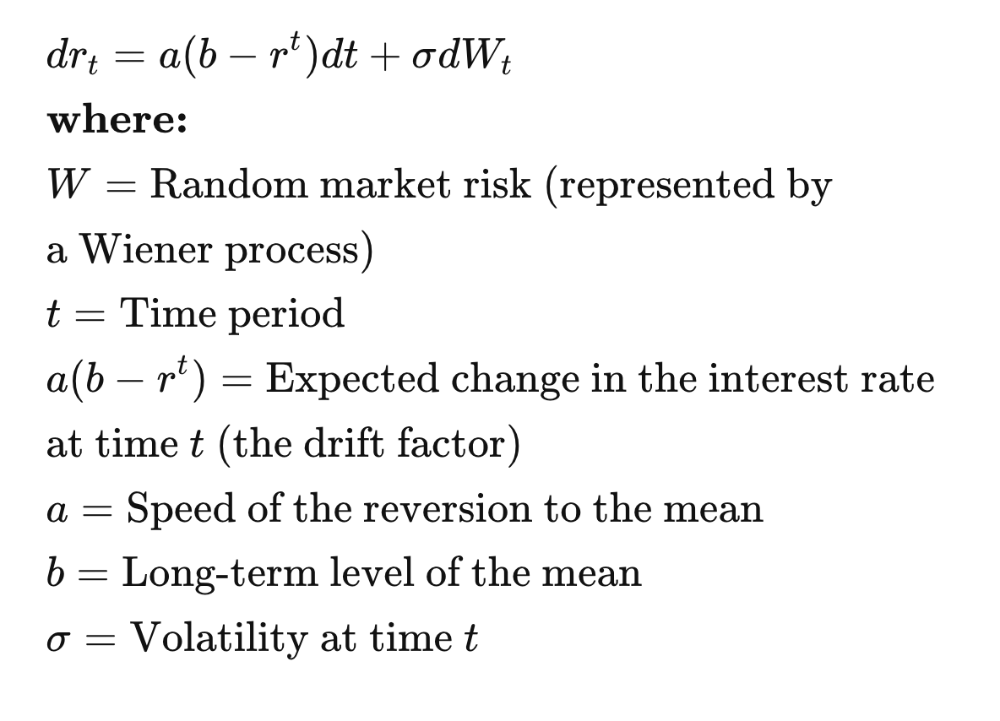

In [452]:
Image(wd + '/Vasicek Interest Rate Model Formula.png', width = 400)

In [453]:
def VasicekNextRate(r, kappa, theta, sigma, dt=1/252):
    # Implements above closed form solution     
    val1 = np.exp(-1*kappa*dt)
    val2 = (sigma**2)*(1-val1**2) / (2*kappa)
    out = r*val1 + theta*(1-val1) + (np.sqrt(val2))*np.random.normal()
    return out



def VasicekSim(N, r0, kappa, theta, sigma, dt = 1/252):
    short_r = [0]*N # Create array to store rates     short_r[0] = r0 # Initialise rates at $r_0$     
    
    for i in range(1,N):
        short_r[i] = VasicekNextRate(short_r[i-1], kappa, theta, sigma, dt)
    
    return short_r




def VasicekMultiSim(M, N, r0, kappa, theta, sigma, dt = 1/252):
    sim_arr = np.ndarray((N, M))
    
    for i in range(0,M):
        sim_arr[:, i] = VasicekSim(N, r0, kappa, theta, sigma, dt)
    
    return sim_arr



def VasicekCalibration(rates, dt=1/252):
    n = len(rates)
    
    # Implement MLE to calibrate parameters 
    Sx = sum(rates[0:(n-1)])
    Sy = sum(rates[1:n])
    Sxx = np.dot(rates[0:(n-1)], rates[0:(n-1)])
    Sxy = np.dot(rates[0:(n-1)], rates[1:n])
    Syy = np.dot(rates[1:n], rates[1:n])
    
    theta = (Sy * Sxx - Sx * Sxy) / (n * (Sxx - Sxy) - (Sx**2 - Sx*Sy))
    kappa = -np.log((Sxy - theta * Sx - theta * Sy + n * theta**2) / (Sxx - 2*theta*Sx + n*theta**2)) / dt
    a = np.exp(-kappa * dt)
    sigmah2 = (Syy - 2*a*Sxy + a**2 * Sxx - 2*theta*(1-a)*(Sy - a*Sx) + n*theta**2 * (1-a)**2) / n
    sigma = np.sqrt(sigmah2*2*kappa / (1-a**2))
    r0 = rates[n-1]
    
    return [kappa, theta, sigma, r0]

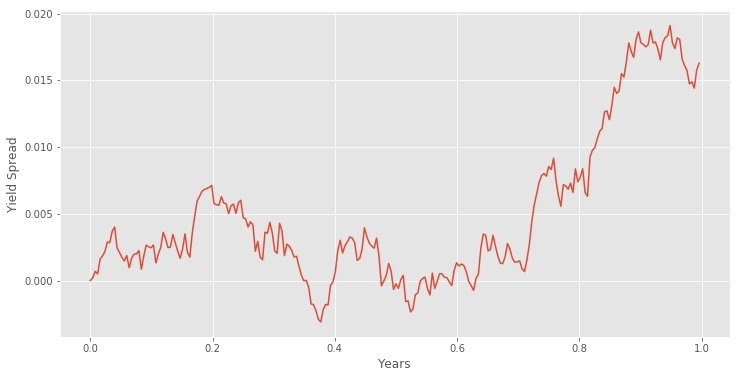

In [454]:
params = VasicekCalibration(yieldsp.loc[:, 'yieldsp'].dropna()/100)
#params = VasicekCalibration(yieldsp.dropna()/100)
kappa = params[0]
theta = params[1]
sigma = params[2]
r0 = params[3]

years = 1
N = years * 252
t = np.arange(0,N)/252

test_sim = VasicekSim(N, r0, kappa, theta, sigma, 1/252)
plt.plot(t,test_sim)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.show()

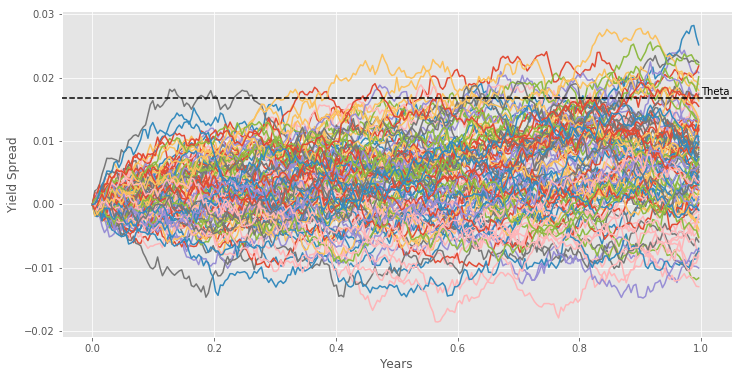

In [455]:
M = 100
rates_arr = VasicekMultiSim(M, N, r0, kappa, theta, sigma)

plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta + 0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.show()


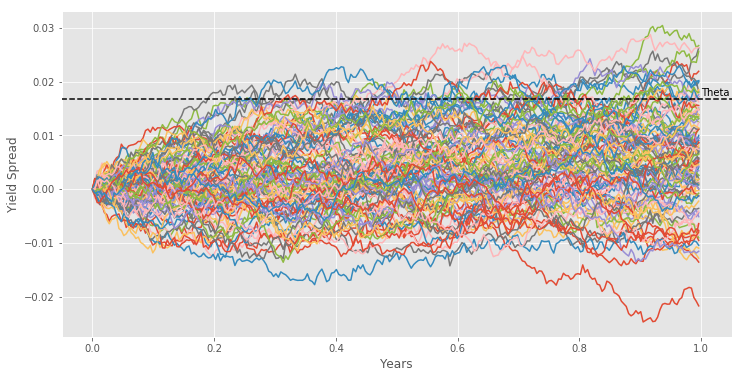

In [456]:
M = 100
rates_arr = VasicekMultiSim(M, N, -0.01, kappa, theta, sigma)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.show()


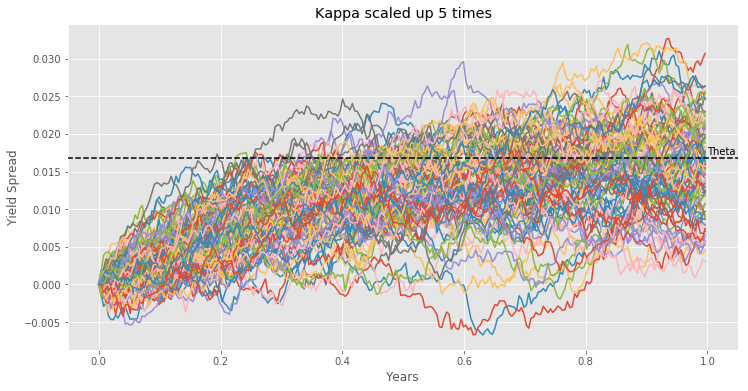

In [457]:
M = 100
rates_arr = VasicekMultiSim(M, N, -0.01, kappa*5, theta, sigma)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("Kappa scaled up 5 times")
plt.show()


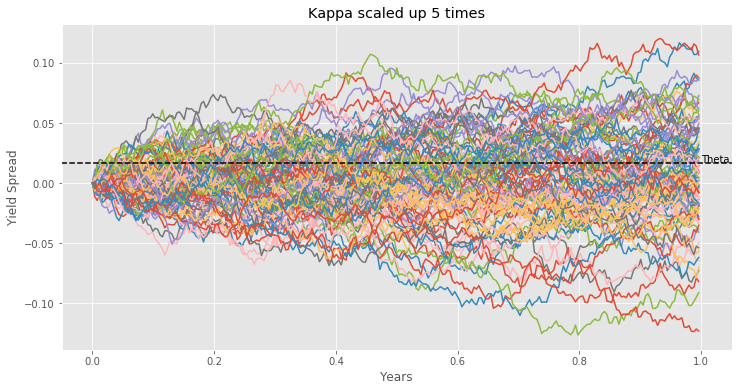

In [458]:
M = 100
rates_arr = VasicekMultiSim(M, N, -0.01, kappa, theta, sigma*5)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("Kappa scaled up 5 times")
plt.show()


In [24]:
# We define the grid search procedure as the arima_grid_search() function
# fit a seasonal ARIMA model with the SARIMAX() function of the statsmodels module in each iteration, 
# It returns an object of the MLEResults class. 
# The MLEResults object holds an aic attribute for returning the AIC value. 
# The model with the lowest AIC value gives us the best-fitting model that determines our parameters of p, d, and q.
# The SARIMAX (seasonal autoregressive integrated moving average with exogenous regressors model) function 
# we provided the seasonal_order parameter, which is the ARIMA(p,d,q,s) seasonal component, 
# where s is the number of periods in a season of the dataset. 

# enforce_stationarity=False: parameter doesn't transform the AR parameters to stationaize the model's AR component
# enforce_invertibility=False: parameter doesn't transform MA parameters to make the model's MA component invertable
# disp=False parameter suppresses output information when fitting our models.




import itertools    
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX

warnings.filterwarnings("ignore")

def arima_grid_search(dataframe, s):
    p = d = q = range(2)
    param_combinations = list(itertools.product(p, d, q))
    lowest_aic, pdq, pdqs = None, None, None
    total_iterations = 0
    for order in param_combinations:    
        for (p, q, d) in param_combinations:
            seasonal_order = (p, q, d, s)
            total_iterations += 1
            try:
                model = SARIMAX(data['yieldsp'], order=order, 
                    seasonal_order=seasonal_order, 
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    disp=False
                )
                model_result = model.fit(maxiter=200, disp=False)

                if not lowest_aic or model_result.aic < lowest_aic:
                    lowest_aic = model_result.aic
                    pdq, pdqs = order, seasonal_order

            except Exception as ex:
                continue

    return lowest_aic, pdq, pdqs 

In [79]:
lowest_aic, order, seasonal_order = arima_grid_search(data['yieldsp'], 12)
print('ARIMA{}x{}'.format(order, seasonal_order))
print('Lowest AIC: %.3f'%lowest_aic)

ARIMA(1, 0, 1)x(0, 0, 0, 12)
Lowest AIC: -17344.695


In [80]:
model = SARIMAX(
        data['yieldsp'],
        order=order,
        seasonal_order=seasonal_order,
        enforce_stationarity=False,
        enforce_invertibility=False,
        disp=False
    )

model_results = model.fit(maxiter=200, disp=False)
model_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                yieldsp   No. Observations:                 6688
Model:               SARIMAX(1, 0, 1)   Log Likelihood                8675.348
Date:                Mon, 29 Jun 2020   AIC                         -17344.695
Time:                        09:10:01   BIC                         -17324.272
Sample:                             0   HQIC                        -17337.642
                               - 6688                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9992      0.000   2391.672      0.000       0.998       1.000
ma.L1          0.0830      0.006     13.413      0.000       0.071       0.095
sigma2         0.0044   3.08e-05    141.725      0.000       0.004       0.004
===================================================================================
Ljung-Box (Q):                      215.18   Jarque-Bera (JB):             28658.27
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.55   Skew:                             0.32
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

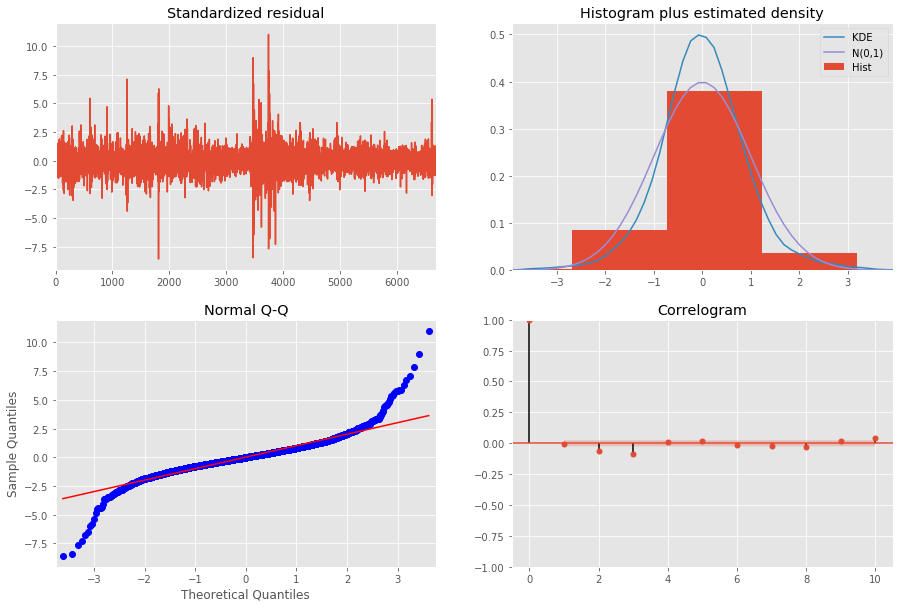

In [81]:
# Run model diagnostics to investigate that model assumptions haven't been violated:
model_results.plot_diagnostics(figsize=(15, 10));

The top-right plot shows the kernel density estimate (KDE) of the standardized residuals, which suggests the errors are Gaussian with a mean close to zero.

A more accurate statistic of the residuals suggest that the mean is 0. If the nean is non-zero, then the prediction may be biased positively.

In [82]:
model_results.resid.describe()

count    6688.000000
mean        0.001241
std         0.072119
min        -0.565783
25%        -0.034589
50%        -0.000204
75%         0.035171
max         2.360000
dtype: float64

In [84]:
# start parameter = perform an in-sample prediction of the most recent five years' prices. 
# end parameter= perform an out-of-sample forecast of the next five days.

n = len(data['yieldsp'].index) # converts into datetime index
pred = model_results.get_prediction(
start = n-5, 
end = n+5
)
pred_ci = pred.conf_int()

#pred_ci.index = pd.date_range("2020-06-15", "2020-06-25", periods=len(pred_ci.index))
pred_ci.index = pd.date_range(start="2020-06-20",end="2020-06-29" )

# inspect the top three forecasted confidence interval values
pred_ci.tail()

,lower yieldsp,upper yieldsp
2020-07-01,0.326821,0.708625
2020-07-02,0.280532,0.754123
2020-07-03,0.241850,0.792016
2020-07-04,0.207930,0.825147
2020-07-05,0.177355,0.854933


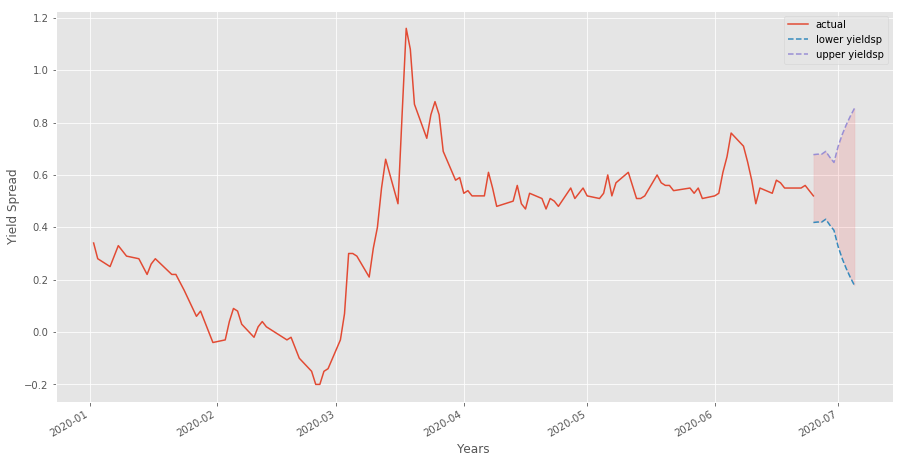

In [85]:
plt.figure(figsize=(15, 8))
ax = data['yieldsp']['2020':].plot(label='actual')

pred_ci.plot(
ax = ax, style=['--', '--'],
label='predicted/forecasted')

ci_index = pred_ci.index
lower_ci = pred_ci.iloc[:, 0]
upper_ci = pred_ci.iloc[:, 1]

ax.fill_between(ci_index, lower_ci, upper_ci,
color='r', alpha=.1)

ax.set_xlabel('Years')
ax.set_ylabel('Yield Spread')

plt.legend()
plt.show()

In [459]:
def adfuller_test(series, signif = 0.05, name = '', verbose = False):
    """Perform ADFuller to test for stationarity of a given series and print report"""
    
    r = adfuller(series, autolag = 'AIC')
    output = {'test_statistic': round(r[0], 4), 'pvalue': round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue']
    def adjust(val, length = 6): return str(val).ljust(length)
    
    # print sumamry
    print(f'     Augmented Dickey-Fuller Test on "{name}"', "\n    ", '-'*47)
    print(f'  Null Hypothesis: Data has unit too. Non-Stationary.')
    print(f'  Significance Level    = {signif}')
    print(f'  Test Statistic        = {output["test_statistic"]}')
    print(f'  No. of Lags Chosen    = {output["n_lags"]}')
          
    for key, val in r[4].items():
          print(f'  Critical Value {adjust(key)} = {round(val, 3)}')
          
    if p_value <= signif:
          print(f" => P-Value = {p_value}. Rejecting null hypothesis.")
          print(f" => Series is stationary.")
    else:
          print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
          print(f" => Series is non-stationary.")

In [460]:
# ADF test on the entire series of yield curve from Jan 1, 1982 to June 30,2020 => stationary
adfuller_test(yieldsp['yieldsp'], signif = 0.05, name = 'Yield Spread', verbose = False)

     Augmented Dickey-Fuller Test on "Yield Spread" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. Non-Stationary.
  Significance Level    = 0.05
  Test Statistic        = -3.6085
  No. of Lags Chosen    = 29
  Critical Value 1%     = -3.431
  Critical Value 5%     = -2.862
  Critical Value 10%    = -2.567
 => P-Value = 0.0056. Rejecting null hypothesis.
 => Series is stationary.


In [461]:
# ADF test on partial series of yield curve from Oct 1, 1993 to July 01,2020 => non-stationary
adfuller_test(data['yieldsp'], signif = 0.05, name = 'Yield Spread', verbose = False)

     Augmented Dickey-Fuller Test on "Yield Spread" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. Non-Stationary.
  Significance Level    = 0.05
  Test Statistic        = -2.2383
  No. of Lags Chosen    = 21
  Critical Value 1%     = -3.431
  Critical Value 5%     = -2.862
  Critical Value 10%    = -2.567
 => P-Value = 0.1927. Weak evidence to reject the Null Hypothesis.
 => Series is non-stationary.


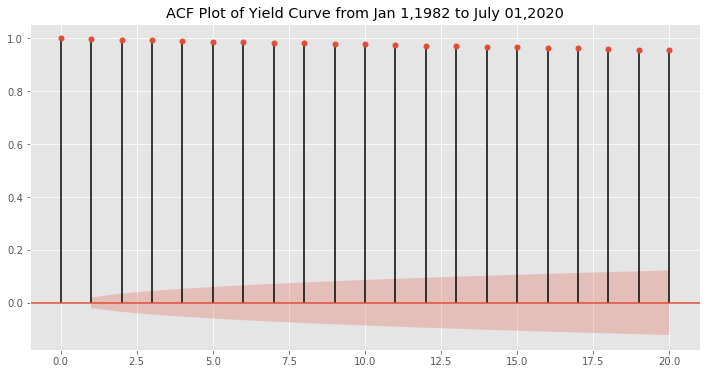

In [463]:
# makes the ACF plot: 
plot_acf(yieldsp, lags = 20, title = 'ACF Plot of Yield Curve from Jan 1,1982 to July 01,2020');

# the plots show strong autocorrelation of lags as spikes very gradually reduce.
pyplot.show()

The partial autocorrelation (PAC) measures the correlation between yt and yt−n after controlling for correlations at intermediate lags. In other words, the PAC at lag n is the regression coefficient on yt−n when yt is regressed on a constant and yt−1,…, yt−n.

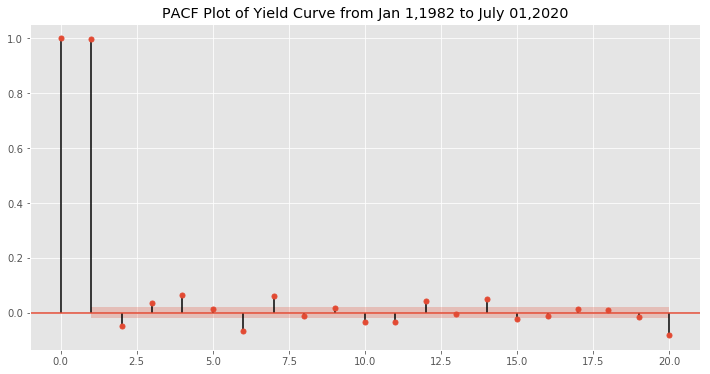

In [464]:
# makes the PACF plot => try MA(4)
plot_pacf(yieldsp, lags = 20, title = 'PACF Plot of Yield Curve from Jan 1,1982 to July 01,2020')
# The PACF shows a significant lag for perhaps 3 days, with significant lags spotty out to perhaps 20 days.

pyplot.show()

In [465]:
# Since the partial data on yield spread has unit root, => stationarize it by differencing
diff = data['yieldsp'].diff().to_frame()

# drops rows with NaN values, and replaces inf values with 0
yield_diff = diff.dropna(inplace = False).replace([np.inf, -np.inf], 0).dropna(axis=1)

adfuller_test(yield_diff['yieldsp'], signif = 0.05, name = 'Yield Spread', verbose = False)

     Augmented Dickey-Fuller Test on "Yield Spread" 
     -----------------------------------------------
  Null Hypothesis: Data has unit too. Non-Stationary.
  Significance Level    = 0.05
  Test Statistic        = -17.6005
  No. of Lags Chosen    = 20
  Critical Value 1%     = -3.431
  Critical Value 5%     = -2.862
  Critical Value 10%    = -2.567
 => P-Value = 0.0. Rejecting null hypothesis.
 => Series is stationary.


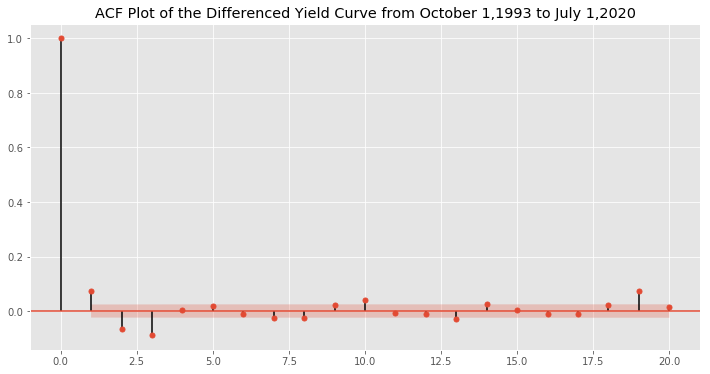

In [466]:
# makes the ACF plot of the differenced yield curve => try AR(3)
plot_acf(yield_diff['yieldsp'], lags = 20, 
          title = 'ACF Plot of the Differenced Yield Curve from October 1,1993 to July 1,2020')

pyplot.show()

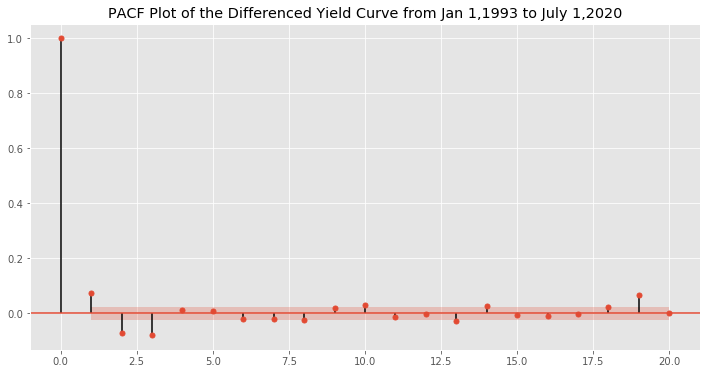

In [467]:
# makes the PACF plot of the differenced yield curve => try MA(3)
plot_pacf(yield_diff['yieldsp'], lags = 20, 
          title = 'PACF Plot of the Differenced Yield Curve from Jan 1,1993 to July 1,2020')

pyplot.show()

### ARIMA Model

The foundation of time series models is based on the assumption that the disturbance term is a white noise process. The implication of this assumption is that the last period's disturbance term cannot be used to predict the current disturbance term and that the disturbance term has constant variance. In other words, the implication of this assumption is the absence of serial correlation (or predictability) and homoscedasticity (or conditional constant variance). ARMA models that allow for serial dependence in the observations.

 The moving average (MA) models are treated as simple extensions of a white noise series. In other words, an MA model is a linear regression model of the current value of the series against the unobserved white noise error terms or shocks.

In [509]:
# fit model in the whole dataset
model = ARIMA(yieldsp, order=(1,0,4)) 
# ARIMA(6,1,4) has a lower AIC of -22345.248 than ARIMA(1,0,4)
# disp = 0: turns off the debug info about the fit of the ARIMA model
model_fit = model.fit(disp=0)
print(model_fit.summary())

/Users/joshi27s/opt/anaconda3/envs/tsa_course/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:225: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



                              ARMA Model Results                              
Dep. Variable:                yieldsp   No. Observations:                 9627
Model:                     ARMA(1, 4)   Log Likelihood               11115.234
Method:                       css-mle   S.D. of innovations              0.076
Date:                Thu, 02 Jul 2020   AIC                         -22216.468
Time:                        15:00:58   BIC                         -22166.261
Sample:                             0   HQIC                        -22199.441
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             1.7282      0.340      5.089      0.000       1.063       2.394
ar.L1.yieldsp     0.9980      0.001   1573.795      0.000       0.997       0.999
ma.L1.yieldsp     0.0507      0.010     

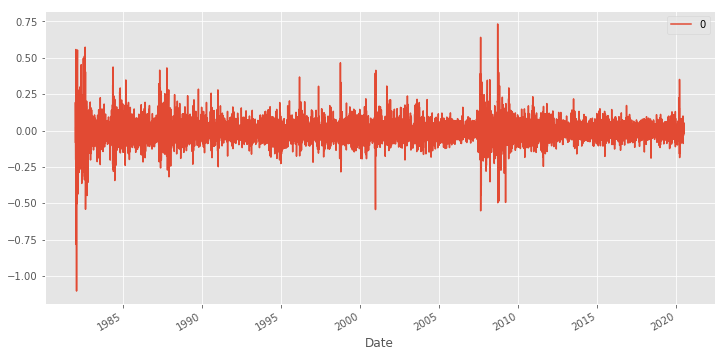

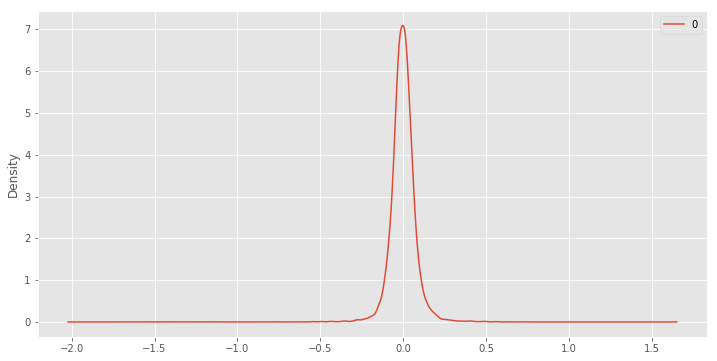

                 0
count  9626.000000
mean      0.000002
std       0.075734
min      -1.103890
25%      -0.037628
50%      -0.001376
75%       0.035934
max       0.732831


In [477]:
# plot residual errors
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()

# Density plot
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

The line plot of residuals suggest that the model captures of the trend information. The density plot suggests that the errors are Gaussian, and centered at zero. From the distribution of the errors, the mean = 0.000002 is almost 0. So, there is no bias in the predictions. 

In [482]:
# fit the model on the train set and generate prediction for each element on the test set.
# perform a rolling forecast : re-create the ARIMA forecast when each new observation is received. 
# forecast(): performs a one-step forecast from the model
# history - list created to track all the observations seeded with the training set
# => after each iteration, all new observations are appended to the list "history",


X = yieldsp.values
size = int(len(X) * 0.95)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()

# walk-forward validation
for t in range(len(test)):
    model = ARIMA(history, order=(1,0,4))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
        

predicted=0.996081, expected=0.960000
predicted=0.959644, expected=0.940000
predicted=0.937272, expected=0.930000
predicted=0.932651, expected=0.970000
predicted=0.976372, expected=0.960000
predicted=0.961283, expected=0.940000
predicted=0.938876, expected=0.890000
predicted=0.890094, expected=0.920000
predicted=0.926603, expected=0.900000
predicted=0.904008, expected=0.870000
predicted=0.870388, expected=0.820000
predicted=0.821397, expected=0.820000
predicted=0.826457, expected=0.810000
predicted=0.815923, expected=0.790000
predicted=0.792929, expected=0.800000
predicted=0.804365, expected=0.820000
predicted=0.825086, expected=0.760000
predicted=0.758940, expected=0.770000
predicted=0.773067, expected=0.730000
predicted=0.733980, expected=0.740000
predicted=0.744833, expected=0.730000
predicted=0.734124, expected=0.730000
predicted=0.733365, expected=0.750000
predicted=0.754091, expected=0.760000
predicted=0.762924, expected=0.750000
predicted=0.750487, expected=0.750000
predicted=0.

predicted=-0.186016, expected=-0.140000
predicted=-0.134684, expected=-0.120000
predicted=-0.118026, expected=-0.110000
predicted=-0.109900, expected=-0.090000
predicted=-0.087902, expected=-0.110000
predicted=-0.108823, expected=-0.140000
predicted=-0.138902, expected=-0.160000
predicted=-0.155599, expected=-0.150000
predicted=-0.142644, expected=-0.130000
predicted=-0.123366, expected=-0.040000
predicted=-0.032330, expected=-0.110000
predicted=-0.113064, expected=-0.120000
predicted=-0.121044, expected=-0.100000
predicted=-0.092192, expected=-0.130000
predicted=-0.125815, expected=-0.120000
predicted=-0.116395, expected=-0.180000
predicted=-0.177457, expected=-0.220000
predicted=-0.216062, expected=-0.250000
predicted=-0.242544, expected=-0.190000
predicted=-0.177959, expected=-0.210000
predicted=-0.205293, expected=-0.190000
predicted=-0.187351, expected=-0.130000
predicted=-0.123134, expected=-0.040000
predicted=-0.033726, expected=-0.020000
predicted=-0.022106, expected=-0.070000


predicted=0.507757, expected=0.560000
predicted=0.571151, expected=0.490000
predicted=0.487333, expected=0.470000
predicted=0.469230, expected=0.530000
predicted=0.540140, expected=0.510000
predicted=0.512997, expected=0.470000
predicted=0.467336, expected=0.510000
predicted=0.516069, expected=0.500000
predicted=0.504509, expected=0.480000
predicted=0.479903, expected=0.550000
predicted=0.556476, expected=0.510000
predicted=0.510625, expected=0.530000
predicted=0.530342, expected=0.550000
predicted=0.554220, expected=0.520000
predicted=0.520220, expected=0.510000
predicted=0.510865, expected=0.530000
predicted=0.535478, expected=0.600000
predicted=0.606803, expected=0.520000
predicted=0.515504, expected=0.570000
predicted=0.572163, expected=0.610000
predicted=0.617143, expected=0.560000
predicted=0.557254, expected=0.510000
predicted=0.507311, expected=0.510000
predicted=0.516635, expected=0.520000
predicted=0.527421, expected=0.600000
predicted=0.607035, expected=0.570000
predicted=0.

In [502]:
pred = pd.DataFrame(predictions, columns = ['Predictions'])
#yieldsp.iloc[-len(test):,] #=> finds the 963rd row from the bottom => date is Aug 28, 2018


pred.index = pd.date_range(start="2019-03-08",end="2020-07-01" )
test = pd.DataFrame(test, columns = ['Test'])
test.index = pd.date_range(start="2019-03-08",end="2020-07-01" )
merge = pd.merge(pred, test, how='inner', left_index=True, right_index=True)
merge.tail()

,Predictions,Test
2020-06-27,0.541265,0.52
2020-06-28,0.521581,0.50
2020-06-29,0.503341,0.50
2020-06-30,0.504954,0.50
2020-07-01,0.504407,0.55


In [504]:
error = mean_squared_error(test, predictions)
rmse = sqrt(mse)
print('RMSE: %.3f' % rmse)

RMSE: 0.048


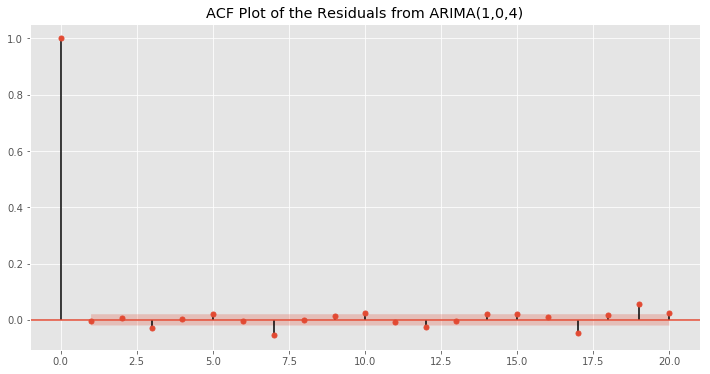

In [505]:
# makes the ACF plot of the differenced yield curve
plot_acf(residuals, lags = 20, 
          title = 'ACF Plot of the Residuals from ARIMA(1,0,4)')

pyplot.show()

In [507]:
# line plot shows the expected values (red) compared to the rolling forecast predictions (blue).
test_df = go.Scatter(x = merge.index, y = merge['Test'], line=dict(color='red', width= 1))

layout = go.Layout(title='Yield Spread (10 Year - 2 Month Treasury Rate)', 
                   title_font_size=15, 
                   xaxis_title="Years", yaxis_title="Yield Spread", 
                   xaxis_range=[datetime.datetime(2019, 3, 8),
                   datetime.datetime(2020, 7, 1)])

pred_df = go.Scatter(x = merge.index,
                        y= merge['Predictions'],
                        line=dict(color='blue', width= 1),
                        opacity=1,
                        name='Predictions',
                        yaxis='y2')


# Create a layout with two yaxes
layout = go.Layout(height=600, width=1000, font=dict(size=15),
                   title='Predicted and Actual Yield Spread',
                   xaxis=dict(title='Date', type='date'),
                   
                   yaxis=dict(title='Test', color='red'),
                   # Add a second yaxis to the right of the plot
                   yaxis2=dict(title='Predicted', color='blue',
                                          overlaying='y',
                                          side='right'),
                   xaxis_range=[datetime.datetime(2019, 3, 8),
                   datetime.datetime(2020, 7, 1)]
                   )

fig = go.Figure(data=[test_df, pred_df], layout=layout)
iplot(fig)

In [510]:
X = yieldsp.values
    

# multi-step out-of-sample forecast
start_index = len(yieldsp)
end_index = start_index + 6

forecast = model_fit.predict(start=start_index, end=end_index)

# invert the differenced forecast to something usable
history = [x for x in X]

day = date(2020,7,2)

for yhat in forecast:
    print('{}: {}'.format(day, yhat))
    history.append(forecast)
    day += timedelta(days=1)

2020-07-02: 0.5556588983431237
2020-07-03: 0.5574054358668811
2020-07-04: 0.5567467541834609
2020-07-05: 0.5578343826603729
2020-07-06: 0.5602062411023236
2020-07-07: 0.562573292816929
2020-07-08: 0.5649355475453386


/Users/joshi27s/opt/anaconda3/envs/tsa_course/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:531: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [511]:
X = data['yieldsp'].values


# invert the differenced operation by adding the value of the observation one day ago. 
# => do this to any forecasts made by a model trained on the differenced data.

def invert_diff(history, yhat, interval=1):
    return yhat + history[-interval]

# fit model
model = ARIMA(yield_diff, order=(3,0,3))
mod_fit = model.fit(disp=0)
mod_fit.summary()

/Users/joshi27s/opt/anaconda3/envs/tsa_course/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:225: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                yieldsp   No. Observations:                 6690
Model:                     ARMA(3, 3)   Log Likelihood                8722.620
Method:                       css-mle   S.D. of innovations              0.066
Date:                Thu, 02 Jul 2020   AIC                         -17429.239
Time:                        15:01:59   BIC                         -17374.772
Sample:                             0   HQIC                        -17410.428
                                                                              
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0003      0.001     -0.376      0.707      -0.002       0.001
ar.L1.yieldsp     1.2872      0.084     15.363      0.000       1.123       1.451
ar.L2.yieldsp    -1.2548      0.073    -17.196      0.000      -1.398      -1.112
ar.L3.yieldsp     0.7448      0.080      9.267      0.000       0.587       0.902
ma.L1.yieldsp    -1.2503      0.085    -14.736      0.000      -1.417      -1.084
ma.L2.yieldsp     1.1679      0.083     14.034      0.000       1.005       1.331
ma.L3.yieldsp    -0.7136      0.078     -9.200      0.000      -0.866      -0.562
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.2508           -1.0353j            1.0653           -0.2122
AR.2            0.2508           +1.0353j            1.0653            0.2122
AR.3            1.1832           -0.0000j            1.1832           -0.0000
MA.1            1.1650           -0.0000j            1.1650           -0.0000
MA.2            0.2357           -1.0711j            1.0967           -0.2155
MA.3            0.2357           +1.0711j            1.0967            0.2155
-----------------------------------------------------------------------------
"""

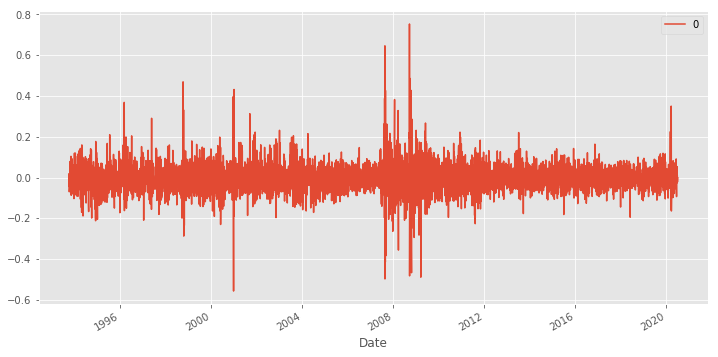

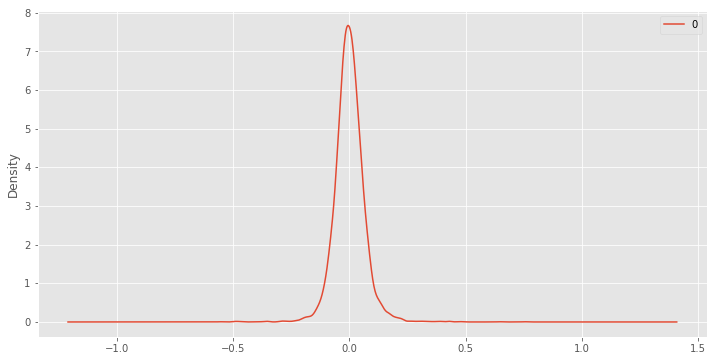

                 0
count  6690.000000
mean     -0.000002
std       0.065697
min      -0.556162
25%      -0.035127
50%      -0.001567
75%       0.033893
max       0.753454


In [512]:
# plot residual errors
residuals = DataFrame(mod_fit.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

In [513]:
X = data['yieldsp'].values


# multi-step out-of-sample forecast
start_index = len(yield_diff)
end_index = start_index + 6

forecast = mod_fit.predict(start=start_index, end=end_index)


# invert the differenced forecast to something usable
history = [x for x in X]
day = date(2020,7,2)
gap = 1

for yhat in forecast:
    inverted = invert_diff(history, yhat, gap)
    print('{}: {}'.format(day, inverted))
    history.append(inverted)
    day += timedelta(days=1)

2020-07-02: 0.4992677854471461
2020-07-03: 0.49845047279289084
2020-07-04: 0.49899636289700555
2020-07-05: 0.5001176881712021
2020-07-06: 0.5002057943577272
2020-07-07: 0.4992571803636659
2020-07-08: 0.49869915510461327


/Users/joshi27s/opt/anaconda3/envs/tsa_course/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:531: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



## References:

https://www.gid.works/2018/10/09/3d-yield-curve.html - 3D graph of the yield curve

https://clinthoward.github.io/portfolio/2017/08/19/Rates-Simulations/ - PCA and Vasicek model simulations

https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/ - ARIMA models

https://machinelearningmastery.com/make-sample-forecasts-arima-python/ - Out of sample forecasting

https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/ - Classical models including ARIMAX, VARMAX
